In [1]:
import os, sys, glob, pdb, time
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image
from scipy import ndimage
from skimage import measure
from tqdm.notebook import tqdm
from multiprocessing import Pool

# Figure 1

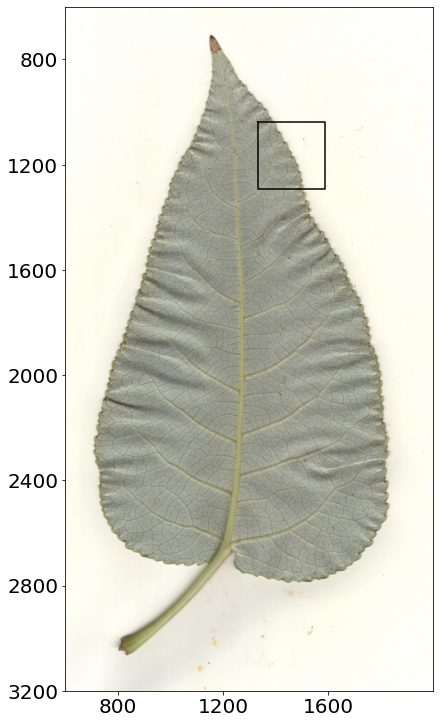

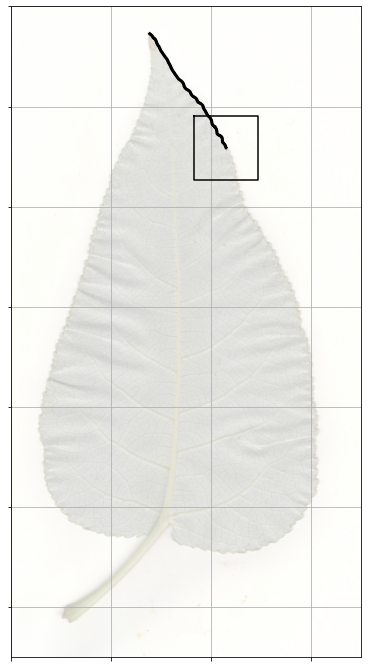

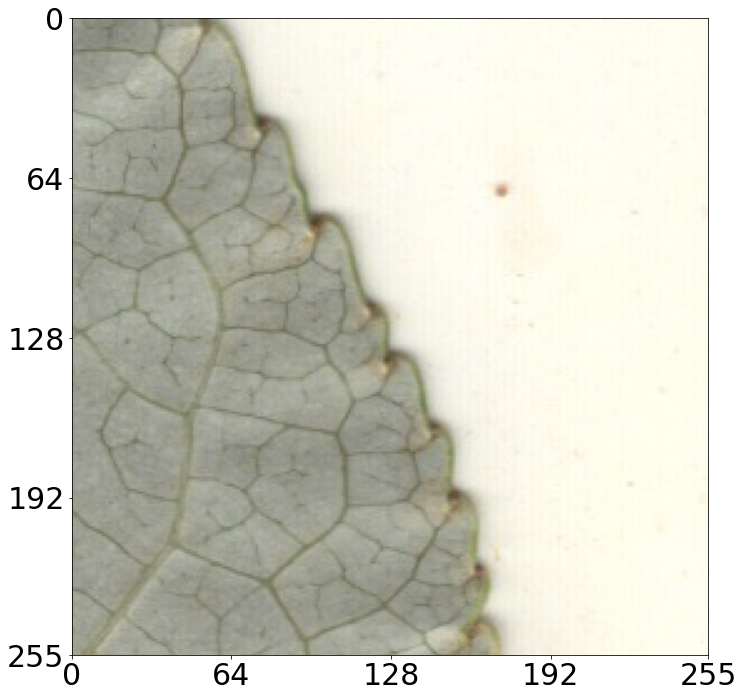

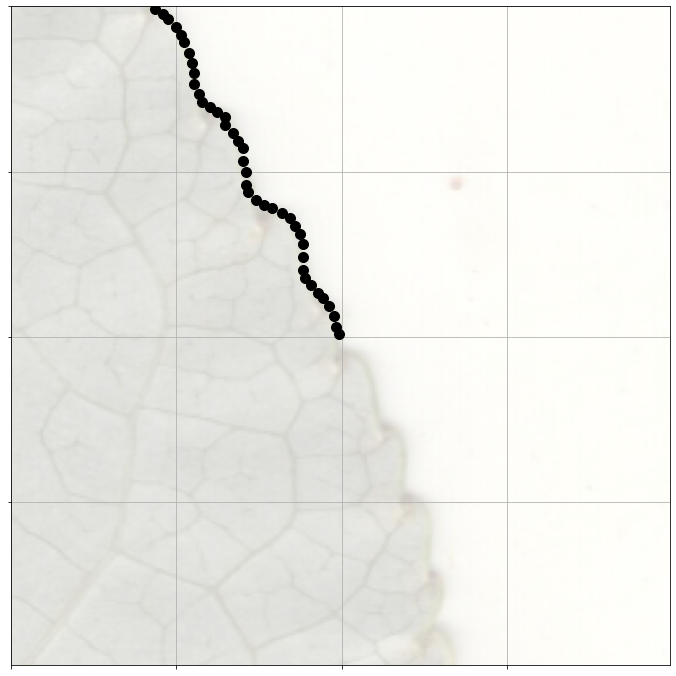

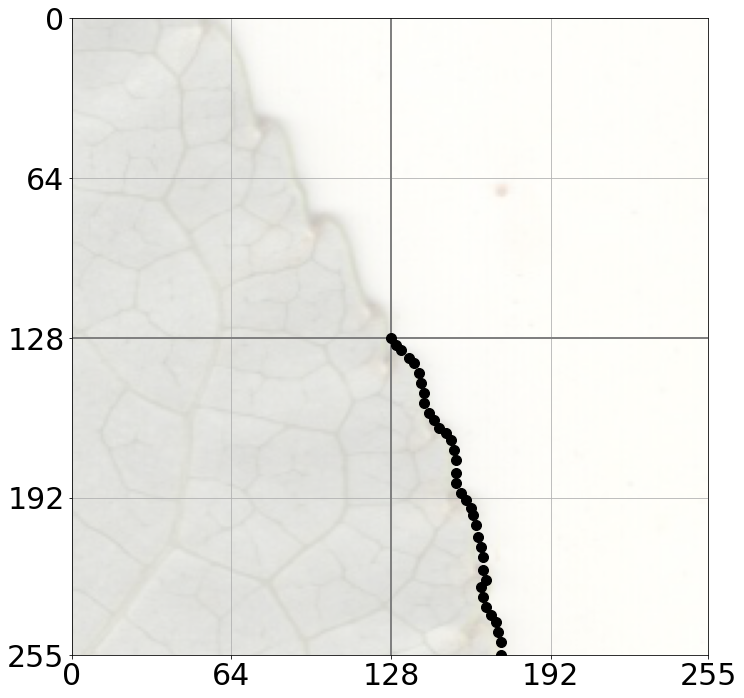

In [2]:
# options
image_path = '../data/images/C_1_1_2_bot.jpeg'
leaf_path = '../data/leaf_preds/C_1_1_2_bot.png'
save_path = '../figures/'
idx = 768
figsize = 5
tick_skip = 400
trace_skip = 5
save = True

# load images
image = np.array(Image.open(image_path), dtype=float)/255
leaf = np.array(Image.open(leaf_path), dtype=float)[:, :, 0] > 128
contour = measure.find_contours(leaf, 0.5)[0]
contour = np.concatenate([contour[contour[:, 0].argmin():], contour[:contour[:, 0].argmin()]])

# image constraints
rmin, rmax = 600, 3200
cmin, cmax = 600, 2000
plot_width = figsize
plot_height = (rmax-rmin)/(cmax-cmin)*figsize

# bounding box coordinates
bbox_rows = (np.array([-128, 128, 128, -128, -128]) + contour[idx, 0] - rmin).astype(int)
bbox_cols = (np.array([-128, -128, 128, 128, -128]) + contour[idx, 1] - cmin).astype(int)

#
# whole leaf
#

# plot image
fig = plt.figure(figsize=[1.2*plot_width, 1.2*plot_height], constrained_layout=True)
plt.imshow(image[rmin:rmax, cmin:cmax], extent=[cmin, cmax, rmax, rmin])
plt.plot(bbox_cols + cmin, bbox_rows + rmin, 'k-')
plt.xticks([i*tick_skip for i in range(15)], [i*tick_skip for i in range(15)], fontsize=20)
plt.yticks([i*tick_skip for i in range(15)], [i*tick_skip for i in range(15)], fontsize=20)
plt.xlim([cmin, cmax-1])
plt.ylim([rmax, rmin])
if save:
    plt.savefig(save_path + 'figure_1_a.png', dpi=200, bbox_inches='tight')
plt.show()

# plot previous trace
fig = plt.figure(figsize=[plot_width, plot_height], constrained_layout=True)
plt.imshow(image[rmin:rmax, cmin:cmax], alpha=0.3)
plt.plot(contour[5:idx, 1] - cmin, contour[5:idx, 0] - rmin, 'k-', linewidth=3)
plt.plot(bbox_cols, bbox_rows, 'k-')
plt.xticks([i*tick_skip for i in range(15)], ['' for i in range(15)], fontsize=20)
plt.yticks([i*tick_skip for i in range(15)], ['' for i in range(15)], fontsize=20)
plt.xlim([0, cmax-cmin])
plt.ylim([rmax-rmin, 0])
plt.grid()
if save:
    plt.savefig(save_path + 'figure_1_b.png', dpi=200, bbox_inches='tight')
plt.show()

#
# input/output tiles
#

# input tile
tile = image[bbox_rows.min()+rmin:bbox_rows.max()+rmin, bbox_cols.min()+cmin:bbox_cols.max()+cmin]

# previous trace
tile_rows = (contour[:idx, 0][::-1] - contour[idx, 0] + 128).astype(int)
tile_cols = (contour[:idx, 1][::-1] - contour[idx, 1] + 128).astype(int)
for i in range(len(tile_rows)):
    r, c = tile_rows[i], tile_cols[i]
    if r < 0 or r > 255 or c < 0 or c > 255:
        break
tile_rows, tile_cols = tile_rows[:i], tile_cols[:i]

# prediction
pred_rows = (contour[idx:, 0] - contour[idx, 0] + 128).astype(int)
pred_cols = (contour[idx:, 1] - contour[idx, 1] + 128).astype(int)
for i in range(len(pred_rows)):
    r, c = pred_rows[i], pred_cols[i]
    if r < 0 or r > 255 or c < 0 or c > 255:
        break
pred_rows, pred_cols = pred_rows[:i], pred_cols[:i]

# tile image
fig = plt.figure(figsize=[1.1*plot_height, 1.1*plot_height], constrained_layout=True)
fig.add_subplot(1, 1, 1)
plt.imshow(tile)
plt.xticks([0, 64, 128, 192, 255], [0, 64, 128, 192, 255], fontsize=30)
plt.yticks([0, 64, 128, 192, 255], [0, 64, 128, 192, 255], fontsize=30)
plt.xlim([0, 255])
plt.ylim([255, 0])
if save:
    plt.savefig(save_path + 'figure_1_c.png', dpi=200, bbox_inches='tight')
plt.show()

# tile trace
fig = plt.figure(figsize=[plot_height, plot_height], constrained_layout=True)
fig.add_subplot(1, 1, 1)
plt.imshow(tile, alpha=0.3)
plt.plot(tile_cols[::trace_skip], tile_rows[::trace_skip], 'ko', markersize=10)
plt.xticks([i*64 for i in range(5)], ['' for i in range(5)])
plt.yticks([i*64 for i in range(5)], ['' for i in range(5)])
plt.xlim([0, 255])
plt.ylim([255, 0])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid()
if save:
    plt.savefig(save_path + 'figure_1_d.png', dpi=200, bbox_inches='tight')
plt.show()

# tile prediction
fig = plt.figure(figsize=[1.1*plot_height, 1.1*plot_height], constrained_layout=True)
fig.add_subplot(1, 1, 1)
plt.imshow(tile, alpha=0.3)
plt.plot([0, 255], [128, 128], '-', c='gray', linewidth=2)
plt.plot([128, 128], [0, 255], '-', c='gray', linewidth=2)
plt.plot(pred_cols[::trace_skip], pred_rows[::trace_skip], 'ko', markersize=10)
plt.xticks([0, 64, 128, 192, 255], [0, 64, 128, 192, 255], fontsize=30)
plt.yticks([0, 64, 128, 192, 255], [0, 64, 128, 192, 255], fontsize=30)
plt.xlim([0, 255])
plt.ylim([255, 0])
plt.grid()
if save:
    plt.savefig(save_path + 'figure_1_e.png', dpi=200, bbox_inches='tight')
plt.show()

# Figure 2

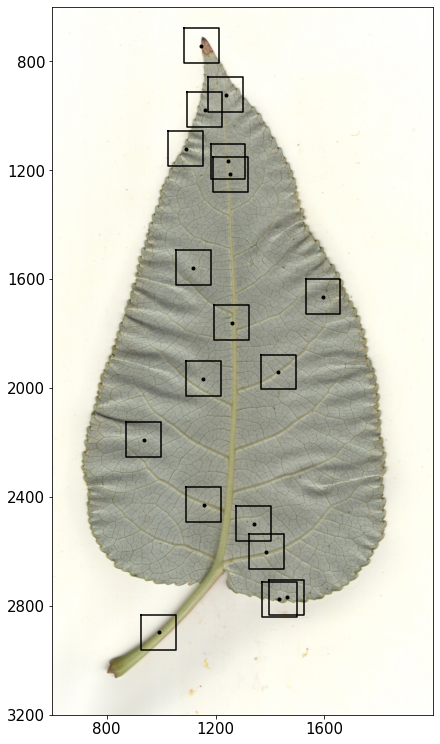

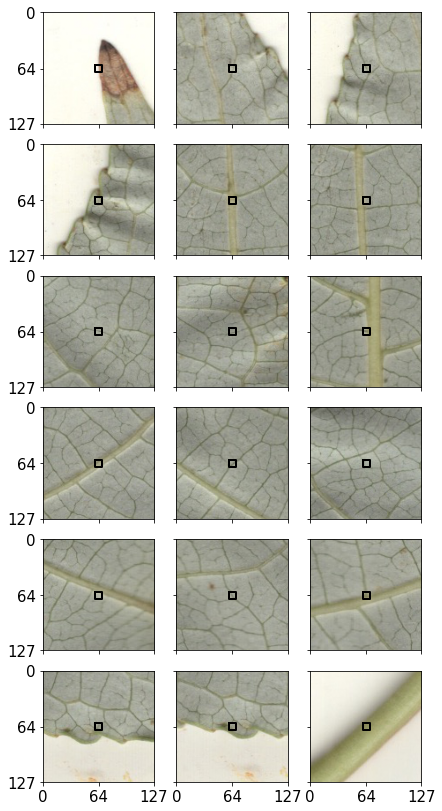

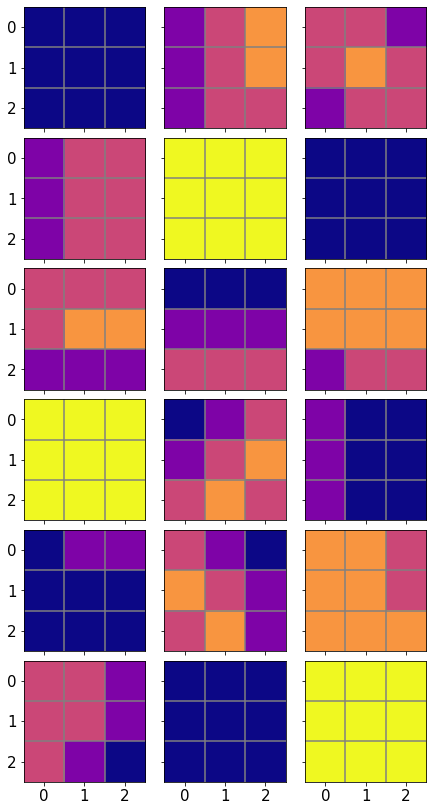

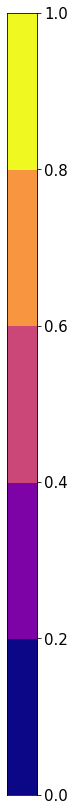

In [3]:
# options
image_path = '../data/images/C_1_1_2_bot.jpeg'
vein_path = '../data/vein_preds/C_1_1_2_bot.png'
prob_path = '../data/vein_probs/C_1_1_2_bot.png'
save_path = '../figures/'
figsize = 5
tick_skip = 400
save = True

# load images
image = np.array(Image.open(image_path), dtype=float)/255
vein = np.array(Image.open(vein_path), dtype=float)[:, :, 0] > 128
prob = np.array(Image.open(prob_path), dtype=float)/255

# image constraints
rmin, rmax = 600, 3200
cmin, cmax = 600, 2000
plot_width = figsize
plot_height = (rmax-rmin)/(cmax-cmin)*figsize

# bounding box coordinates
bbox_rows = np.array([-64, 64, 64, -64, -64])
bbox_cols = np.array([-64, -64, 64, 64, -64])

# seed locations
seeds = np.array(
    [[ 142,  548],
     [ 322,  637],
     [ 378,  560],
     [ 520,  490],
     [ 566,  646],
     [ 614,  654],
     [ 957,  518],
     [1064,  995],
     [1160,  660],
     [1341,  830],
     [1366,  555],
     [1590,  336],
     [1829,  557],
     [1898,  740],
     [2001,  787],
     [2169,  861],
     [2175,  834],
     [2297,  391]])
seeds = seeds[np.argsort(seeds[:,0])]

#
# plot whole leaf
#

fig = plt.figure(figsize=[1.2*plot_width, 1.2*plot_height], constrained_layout=True)
plt.imshow(image[rmin:rmax, cmin:cmax], extent=[cmin, cmax, rmax, rmin])
for i, seed in enumerate(seeds):
    plt.plot(seed[1] + cmin, seed[0] + rmin, 'k.')
    plt.plot(bbox_cols + seed[1] + cmin, bbox_rows + seed[0] + rmin, 'k-')
    if i == 6*3-1:
        break
plt.xticks([i*tick_skip for i in range(15)], [i*tick_skip for i in range(15)], fontsize=15)
plt.yticks([i*tick_skip for i in range(15)], [i*tick_skip for i in range(15)], fontsize=15)
plt.xlim([cmin, cmax-1])
plt.ylim([rmax, rmin])
if save:
    plt.savefig(save_path + 'figure_2_a.png', dpi=200, bbox_inches='tight')
plt.show()

#
# input tiles
#

fig = plt.figure(figsize=[1.2*plot_width, 1.2*plot_height], constrained_layout=True)
for i, seed in enumerate(seeds):
    
    # plot tile
    ax = fig.add_subplot(6, 3, i+1)
    plt.imshow(image[rmin:rmax, cmin:cmax][seed[0]-64:seed[0]+64, seed[1]-64:seed[1]+64])
    plt.plot([60, 68, 68, 60, 60], [60, 60, 68, 68, 60], 'k-', linewidth=2)
    plt.xlim([0, 127])
    plt.ylim([127, 0])
    
    # format axes
    if np.mod(i, 3) == 0 and i >= 15:
        plt.yticks([0, 64, 127], [0, 64, 127], fontsize=15)
        plt.xticks([0, 64, 127], [0, 64, 127], fontsize=15)
    elif np.mod(i, 3) == 0:
        plt.yticks([0, 64, 127], [0, 64, 127], fontsize=15)
        plt.xticks([0, 64, 127], ['', '', ''], fontsize=15)
    elif i >= 15:
        plt.yticks([0, 64, 127], ['', '', ''], fontsize=15)
        plt.xticks([0, 64, 127], [0, 64, 127], fontsize=15)
    else:
        plt.yticks([0, 64, 127], ['', '', ''], fontsize=15)
        plt.xticks([0, 64, 127], ['', '', ''], fontsize=15)
    if i == 6*3-1:
        break
        
if save:
    plt.savefig(save_path + 'figure_2_b.png', dpi=200, bbox_inches='tight')
plt.show()

#
# output tiles
#

fig = plt.figure(figsize=[1.2*plot_width, 1.2*plot_height], constrained_layout=True)
for i, seed in enumerate(seeds):
    
    # format output tile
    n_chunks = 5
    tile = prob[rmin:rmax, cmin:cmax][seed[0]-1:seed[0]+2, seed[1]-1:seed[1]+2] # [3, 3]
    tile = (tile[:, :, None] > np.arange(1, n_chunks+1)[None, None]/n_chunks).sum(-1)/(n_chunks-1)
    
    # plot tile
    ax = fig.add_subplot(6, 3, i+1)
    plt.imshow(tile, cmap='plasma', vmin=0, vmax=1)
    plt.plot([0.5, 0.5], [-0.5, 2.5], c='gray')
    plt.plot([1.5, 1.5], [-0.5, 2.5], c='gray')
    plt.plot([-0.5, 2.5], [0.5, 0.5], c='gray')
    plt.plot([-0.5, 2.5], [1.5, 1.5], c='gray')
    
    # format axes
    if np.mod(i, 3) == 0 and i >= 15:
        plt.yticks([0, 1, 2], [0, 1, 2], fontsize=15)
        plt.xticks([0, 1, 2], [0, 1, 2], fontsize=15)
    elif np.mod(i, 3) == 0:
        plt.yticks([0, 1, 2], [0, 1, 2], fontsize=15)
        plt.xticks([0, 1, 2], ['', '', ''], fontsize=15)
    elif i >= 15:
        plt.yticks([0, 1, 2], ['', '', ''], fontsize=15)
        plt.xticks([0, 1, 2], [0, 1, 2], fontsize=15)
    else:
        plt.yticks([0, 1, 2], ['', '', ''], fontsize=15)
        plt.xticks([0, 1, 2], ['', '', ''], fontsize=15)
    if i == 6*3-1:
        break
        
if save:
    plt.savefig(save_path + 'figure_2_c.png', dpi=200, bbox_inches='tight')
plt.show()

#
# colorbar
#

fig = plt.figure(figsize=[1.2*plot_height/12, 1.2*plot_height], constrained_layout=True)
ax = fig.add_subplot(1, 1, 1)
colorbar = (np.arange(n_chunks)/(n_chunks-1))[:, None]
plt.imshow(colorbar, cmap='plasma', vmin=0, vmax=1, aspect='auto')
ax.yaxis.tick_right()
plt.yticks(np.arange(n_chunks+1)-0.5, np.arange(n_chunks+1)/n_chunks, fontsize=15)
plt.xticks([])
plt.ylim([-0.5, n_chunks-0.5])
if save:
    plt.savefig(save_path + 'figure_2_d.png', dpi=200, bbox_inches='tight')
plt.show()

# Figure 3

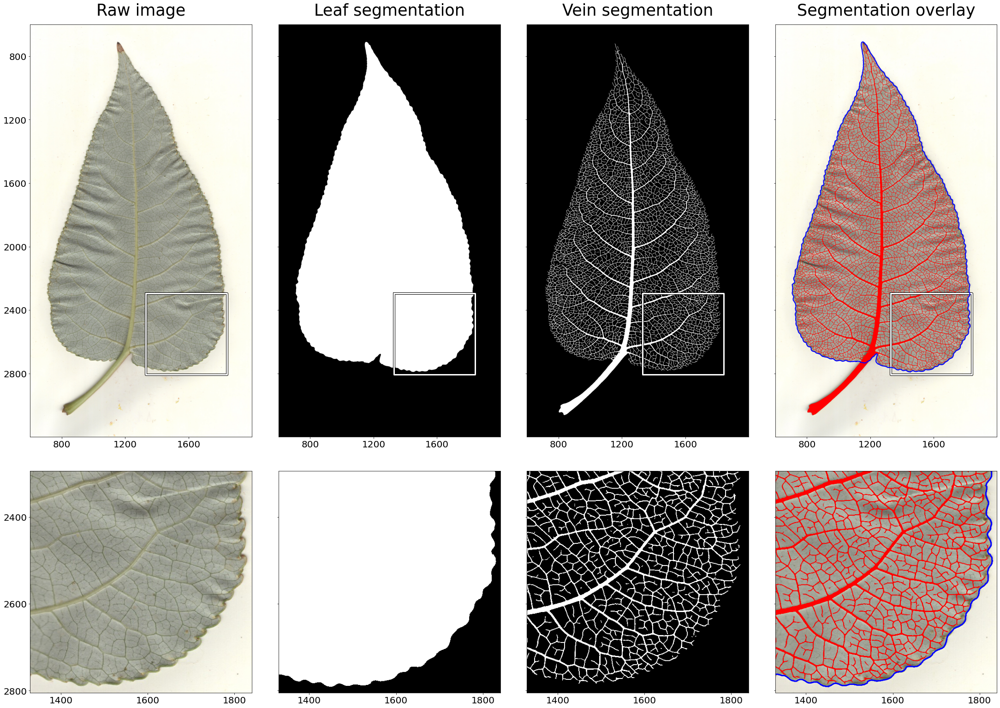

In [4]:
# options
image_path = '../data/images/'
leaf_path = '../data/leaf_preds/'
vein_path = '../data/vein_preds/'
save_path = '../figures/'
name = 'C_1_1_2_bot'
figsize = 7.5
structure = ndimage.generate_binary_structure(2,2)
n_tick = 400
tick_size = 20
title_size = 35
title_pad = 20
save = True

# build bbox
row, col, width = 2550, 1585, 256
bbox_rows = np.array([-width, width, width, -width, -width]) + row
bbox_cols = np.array([-width, -width, width, width, -width]) + col

# load
image = np.array(Image.open(image_path + name + '.jpeg'), dtype=float)/255
leaf = np.array(Image.open(leaf_path + name + '.png'), dtype=float)[:, :, 0] > 128
vein = np.array(Image.open(vein_path + name + '.png'), dtype=float)[:, :, 0] > 128

# compute contour
contour = measure.find_contours(leaf, 0.5)[0]

# format images
rmin, rmax = 600, 3200
cmin, cmax = 600, 2000
image, leaf, vein = image[rmin:rmax, cmin:cmax], leaf[rmin:rmax, cmin:cmax], vein[rmin:rmax, cmin:cmax]
plot_width = figsize
plot_height = (rmax-rmin)/(cmax-cmin)*figsize

# format tiles
image_tile = image[row-width-rmin:row+width-rmin, col-width-cmin:col+width-cmin]
leaf_tile = leaf[row-width-rmin:row+width-rmin, col-width-cmin:col+width-cmin]
vein_tile = vein[row-width-rmin:row+width-rmin, col-width-cmin:col+width-cmin]

# initialize plot
fig = plt.figure(figsize=[4*plot_width, plot_height+plot_width], constrained_layout=True)
gs = fig.add_gridspec(3, 4, wspace=0.1, hspace=0.0)

# image
ax = fig.add_subplot(gs[0:2, 0:1])
plt.imshow(image, vmin=0, vmax=1, extent=[cmin, cmax, rmax, rmin])
plt.plot(bbox_cols, bbox_rows, '-', color='black', linewidth=5)
plt.plot(bbox_cols, bbox_rows, '-', color='white', linewidth=3)
plt.yticks([i*n_tick for i in range(8)], [i*n_tick for i in range(8)], fontsize=tick_size)
plt.xticks([i*n_tick for i in range(8)], [i*n_tick for i in range(8)], fontsize=tick_size)
plt.xlim([cmin, cmax-1])
plt.ylim([rmax, rmin])
ax.set_title('Raw image', fontsize=title_size, pad=title_pad)

# image tile
ax = fig.add_subplot(gs[2:3, 0:1])
plt.imshow(image_tile, vmin=0, vmax=1, extent=[col-width, col+width, row+width, row-width])
plt.yticks([i*200 for i in range(20)], [i*200 for i in range(20)], fontsize=tick_size)
plt.xticks([i*200 for i in range(20)], [i*200 for i in range(20)], fontsize=tick_size)
plt.xlim([col-width, col+width-1])
plt.ylim([row+width-1, row-width])

# leafmask
ax = fig.add_subplot(gs[0:2, 1:2])
plt.imshow(leaf, vmin=0, vmax=1, cmap='gray', extent=[cmin, cmax, rmax, rmin])
plt.plot(bbox_cols, bbox_rows, '-', color='black', linewidth=5)
plt.plot(bbox_cols, bbox_rows, '-', color='white', linewidth=3)
plt.yticks([i*n_tick for i in range(8)], ['' for i in range(8)])
plt.xticks([i*n_tick for i in range(8)], [i*n_tick for i in range(8)], fontsize=tick_size)
plt.xlim([cmin, cmax-1])
plt.ylim([rmax, rmin])
ax.set_title('Leaf segmentation', fontsize=title_size, pad=title_pad)

# leafmask tile
ax = fig.add_subplot(gs[2:3, 1:2])
plt.imshow(leaf_tile, vmin=0, vmax=1, extent=[col-width, col+width, row+width, row-width], cmap='gray')
plt.yticks([i*200 for i in range(20)], ['' for i in range(20)], fontsize=tick_size)
plt.xticks([i*200 for i in range(20)], [i*200 for i in range(20)], fontsize=tick_size)
plt.xlim([col-width, col+width-1])
plt.ylim([row+width-1, row-width])

# veinmask
ax = fig.add_subplot(gs[0:2, 2:3])
plt.imshow(vein, vmin=0, vmax=1, cmap='gray', extent=[cmin, cmax, rmax, rmin])
plt.plot(bbox_cols, bbox_rows, '-', color='black', linewidth=5)
plt.plot(bbox_cols, bbox_rows, '-', color='white', linewidth=3)
plt.yticks([i*n_tick for i in range(8)], ['' for i in range(8)])
plt.xticks([i*n_tick for i in range(8)], [i*n_tick for i in range(8)], fontsize=tick_size)
plt.xlim([cmin, cmax-1])
plt.ylim([rmax, rmin])
ax.set_title('Vein segmentation', fontsize=title_size, pad=title_pad)

# veinmask tile
ax = fig.add_subplot(gs[2:3, 2:3])
plt.imshow(vein_tile, vmin=0, vmax=1, extent=[col-width, col+width, row+width, row-width], cmap='gray')
plt.yticks([i*200 for i in range(20)], ['' for i in range(20)], fontsize=tick_size)
plt.xticks([i*200 for i in range(20)], [i*200 for i in range(20)], fontsize=tick_size)
plt.xlim([col-width, col+width-1])
plt.ylim([row+width-1, row-width])

# overlay
ax = fig.add_subplot(gs[0:2, 3:4])
plot_image = image.copy()
plot_image[vein] = [1, 0, 0]
contour = measure.find_contours(leaf, 0.5)[0] + np.array([[cmin, rmin]])
plt.imshow(plot_image, vmin=0, vmax=1, extent=[cmin, cmax, rmax, rmin])
plt.plot(bbox_cols, bbox_rows, '-', color='black', linewidth=5)
plt.plot(bbox_cols, bbox_rows, '-', color='white', linewidth=3)
plt.plot(contour[:,1], contour[:,0], 'b-', linewidth=2)
plt.yticks([i*n_tick for i in range(8)], ['' for i in range(8)])
plt.xticks([i*n_tick for i in range(8)], [i*n_tick for i in range(8)], fontsize=tick_size)
plt.xlim([cmin, cmax-1])
plt.ylim([rmax, rmin])
ax.set_title('Segmentation overlay', fontsize=title_size, pad=title_pad)

# overlay tile
ax = fig.add_subplot(gs[2:3, 3:4])
plot_tile = image_tile.copy()
plot_tile[vein_tile] = [1, 0, 0]
plt.imshow(plot_tile, vmin=0, vmax=1, extent=[col-width, col+width, row+width, row-width])
plt.plot(contour[:,1], contour[:,0], 'b-', linewidth=3)
plt.yticks([i*200 for i in range(20)], ['' for i in range(20)], fontsize=tick_size)
plt.xticks([i*200 for i in range(20)], [i*200 for i in range(20)], fontsize=tick_size)
plt.xlim([col-width, col+width-1])
plt.ylim([row+width-1, row-width])

if save:
    plt.savefig(save_path + 'figure_3.png', bbox_inches='tight', dpi=100)
plt.show()

# Figure 4

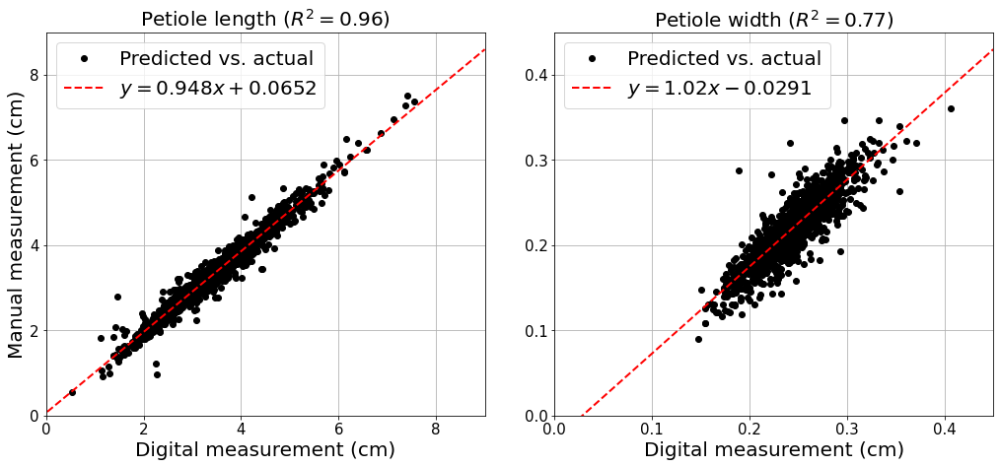

In [5]:
# options
data_path = '../data/results/manual_traits.tsv'
save_path = '../figures/'
plot_width = 7.5
plot_height = 14
save = True

# parse digital/caliper measurements
labels, length_manual, width_manual, length_digital, width_digital = [], [], [], [], []
with open(data_path, 'r') as f:
    for i, line in enumerate(f):
        line = line.split('\t')
        line[-1] = line[-1][:-1]
        if i > 0:
            length_manual.append(float(line[4]))
            width_manual.append(float(line[5]))
            length_digital.append(float(line[6]))
            width_digital.append(float(line[7]))
length_manual, width_manual = np.array(length_manual), np.array(width_manual)
length_digital, width_digital = np.array(length_digital), np.array(width_digital)

# line of best fit
x_length = np.array([-1, 9])
y_length = 0.948*x_length + 0.0652
x_width = np.array([-0.05, 0.45])
y_width = 1.02*x_width - 0.0291

# plot
fig = plt.figure(figsize=[2*plot_width, plot_width])

ax = fig.add_subplot(1, 2, 1)
plt.plot(length_digital, length_manual, 'ko')
plt.plot(x_length, y_length, 'r--', linewidth=2)
plt.ylim([0, 9])
plt.xlim([0, 9])
plt.xticks([0, 2, 4, 6, 8], fontsize=15)
plt.yticks([0, 2, 4, 6, 8], fontsize=15)
plt.grid()
plt.title(r'Petiole length ($R^2 = 0.96$)', fontsize=20)
plt.xlabel('Digital measurement (cm)', fontsize=20)
plt.ylabel('Manual measurement (cm)', fontsize=20)
plt.legend(['Predicted vs. actual', r'$y = 0.948x + 0.0652$'], fontsize=20)

ax = fig.add_subplot(1, 2, 2)
plt.plot(width_digital, width_manual, 'ko')
plt.plot(x_width, y_width, 'r--', linewidth=2)
plt.ylim([0, 0.45])
plt.xlim([0, 0.45])
plt.xticks([0, 0.1, 0.2, 0.3, 0.4], fontsize=15)
plt.yticks([0, 0.1, 0.2, 0.3, 0.4], fontsize=15)
plt.grid()
plt.title(r'Petiole width ($R^2 = 0.77$)', fontsize=20)
plt.xlabel('Digital measurement (cm)', fontsize=20)
plt.legend(['Predicted vs. actual', r'$y = 1.02x - 0.0291$'], fontsize=20)

plt.tight_layout(pad=4)
if save:
    plt.savefig(save_path + 'figure_4.png', bbox_inches='tight', dpi=300)
plt.show()

# Figure 5

  0%|          | 0/849981 [00:00<?, ?it/s]

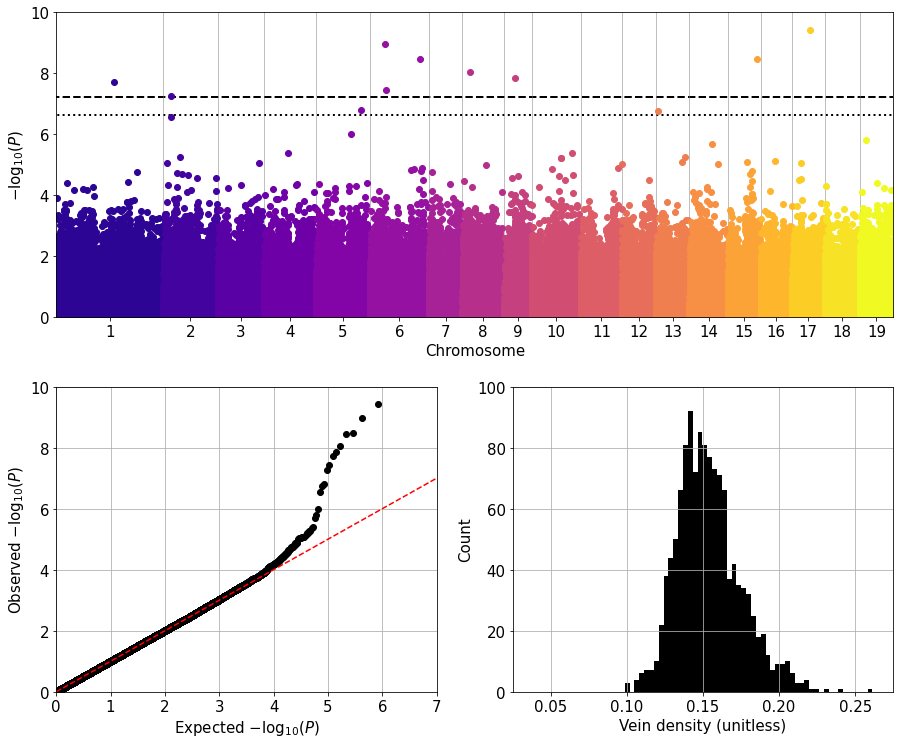

In [6]:
# options
data_path = '../data/results/'
gwas_name = 'gwas_results.csv'
blup_name = 'vein_density_blups.tsv'
save_path = '../figures/'
plot_width = 15
plot_height = 12.5
save = True

#
# load data
#

# loop over lines in csv
snps, chromosomes, positions, p_values, fdr_p_values = [], [], [], [], []
with open(data_path + gwas_name, 'r') as f:
    for i, line in enumerate(tqdm(f, total=849981)):

        # book keeping
        if i == 0:
            continue
        line = line.split(',')
        line[-1] = line[-1][:-1]

        # extract values
        snps.append(line[0])
        chromosomes.append(float(line[1].replace('NA', 'nan')))
        positions.append(float(line[2].replace('NA', 'nan')))
        p_values.append(float(line[3].replace('NA', 'nan')))
        fdr_p_values.append(float(line[8].replace('NA', 'nan')))

# post-process
chromosomes, positions = np.array(chromosomes), np.array(positions), 
p_values, fdr_p_values = np.array(p_values), np.array(fdr_p_values)
chromosomes_u = np.unique(chromosomes)
chromosomes_u = chromosomes_u[np.argsort(chromosomes_u)]

# loop over lines in blups
vein_densities = []
with open(data_path + blup_name, 'r') as f:
    for i, line in enumerate(f):
        if i == 0: continue
        line = line.split('\t')[1]
        vein_densities.append(float(line.replace('NA', 'nan')))
vein_densities = np.array(vein_densities)

#
# manhattan plot
#

fig = plt.figure(figsize=(plot_width, plot_height))
gs = matplotlib.gridspec.GridSpec(100, 2)

ax = plt.subplot(gs[:45, :])

# plot FDR thresholds
p_0p05 = 5.9027278e-08 
p_0p2 = 2.3610911e-07 
plt.plot([-1e10, 1e10], [-np.log10(p_0p05), -np.log10(p_0p05)], '--', color='black', linewidth=2)
plt.plot([-1e10, 1e10], [-np.log10(p_0p2), -np.log10(p_0p2)], ':', color='black', linewidth=2)

# loop over chromosomes
cumsum, cumulative_positions = 0, positions.copy()
tick_positions, tick_labels = [], []
for c in chromosomes_u:

    # find results for chromosome c
    mask = chromosomes == c
    cumulative_positions[mask] += cumsum
    x = cumulative_positions[mask]
    y = p_values[mask]

    # plot book keeping
    color = matplotlib.cm.plasma(c/chromosomes_u.max())[:-1]
    tick_positions.append(x.min() + (x.max()-x.min())/2)
    tick_labels.append(int(c))

    # plot vertical line between chromosomes
    plt.plot([x.max(), x.max()], [0, 10], '-', color='gray', linewidth=0.5)

    # plot gwas hits
    plt.plot(x, -np.log10(y), 'o', color=color)

    # update cumulative sum
    cumsum += x.max() - cumsum

plt.xlim(0, x.max())
plt.ylim(0, 10)
plt.xticks(tick_positions, tick_labels, fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Chromosome', fontsize=15)
plt.ylabel(r'$-\log_{10}(P)$', fontsize=15)

#
# QQ plot
#

# compute quantiles
p_values_sorted = p_values[p_values.argsort()]
rank_order = np.arange(1, len(p_values_sorted)+1)
p_values_expected = rank_order/len(p_values_sorted)
minus_log_p_values_raw = -np.log10(p_values_sorted)
minus_log_p_values_exp = -np.log10(p_values_expected)

ax = plt.subplot(gs[55:, :1])
plt.plot(minus_log_p_values_exp, minus_log_p_values_raw, 'ko')
plt.plot([0, 10], [0, 10], 'r--')
plt.xlim([0, 7])
plt.ylim([0, 10])
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel(r'Expected $-\log_{10}(P)$', fontsize=15)
plt.ylabel(r'Observed $-\log_{10}(P)$', fontsize=15)
plt.grid()

#
# histogram
#

# plot
ax = plt.subplot(gs[55:, 1:])
plt.hist(vein_densities[~np.isnan(vein_densities)], bins=51, color='black')
plt.xticks([0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3], fontsize=15)
plt.yticks(fontsize=15)
plt.xlim([0.025, 0.275])
plt.ylim([0, 100])
plt.xlabel('Vein density (unitless)', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.grid()

if save:
    plt.savefig(save_path + 'figure_5.png', bbox_inches='tight', dpi=300)
plt.show()

# Supplementary Figure S1

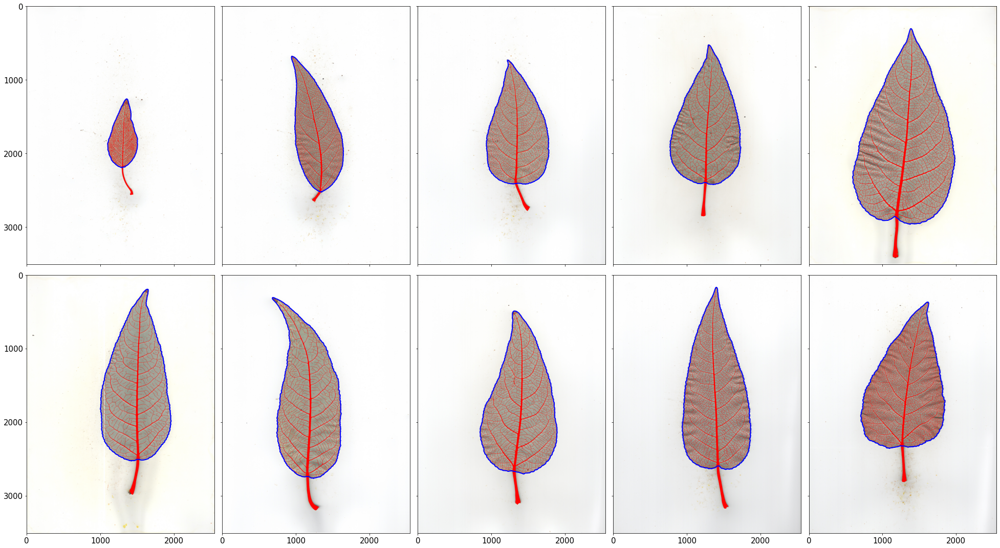

In [7]:
# options
image_path = '../data/images/'
leaf_path = '../data/leaf_preds/'
vein_path = '../data/vein_preds/'
save_path = '../figures/'
n_images = 10
figsize = 7.5
structure = ndimage.generate_binary_structure(2,2)
save = True

#
# order leaves by size and vein density
#

# compute leaf and vein sizes
names = [os.path.basename(f) for f in glob.glob(vein_path + '*.png')]
def do_the_thing(name):
    leaf_size = (np.array(Image.open(leaf_path+name))[:, :, 0] > 128).sum()
    vein_size = (np.array(Image.open(vein_path+name))[:, :, 0] > 128).sum()
    return [leaf_size, vein_size]
with Pool(processes=128) as pool:
    results = pool.map(do_the_thing, names)
leaf_sizes, vein_sizes = np.array(results).T
vein_ratio = vein_sizes / leaf_sizes

# initialize image names for plotting
plot_names = []

# find 5 leaves from smallest to largest
leaf_names = [names[i] for i in np.argsort(leaf_sizes)][:-1]
idx = np.linspace(0, len(leaf_names)-1, 5).astype(int)
for i in idx:
    plot_names.append(leaf_names[i].replace('.png', ''))
    
# find 5 veins from sparse to dense
mask = (leaf_sizes > 1.45*1e6) * (leaf_sizes < 1.55*1e6)
vein_names = [names[i] for i in np.argsort(vein_ratio) if mask[i]]
idx = np.linspace(0, len(vein_names)-1, 5).astype(int)
for i in idx:
    plot_names.append(vein_names[i].replace('.png', ''))
    
#
# plot leaf overlays
#

# plot dimensions
rows, cols = 3510, 2550
plot_width = cols/rows*figsize
plot_height = figsize
n_tick = 1000

fig = plt.figure(figsize=[n_images/2*plot_width, 2*plot_height])
for i, name in enumerate(plot_names):
    
    # load
    image = np.array(Image.open(image_path + name + '.jpeg'), dtype=float)/255
    leaf = np.array(Image.open(leaf_path + name + '.png'), dtype=float)[:, :, 0] > 128
    vein = np.array(Image.open(vein_path + name + '.png'), dtype=float)[:, :, 0] > 128

    # overlay
    ax = fig.add_subplot(2, int(n_images/2), i+1)
    plot_image = image.copy()
    plot_image[vein] = [1, 0, 0]
    contour = measure.find_contours(leaf, 0.5)[0]
    plt.imshow(plot_image, aspect='auto', vmin=0, vmax=1)
    plt.plot(contour[:,1], contour[:,0], 'b-', linewidth=2)
    plt.yticks([i*n_tick for i in range(8)], ['' for i in range(8)])
    plt.xticks([i*n_tick for i in range(8)], ['' for i in range(8)])
    if np.mod(i, int(n_images/2)) == 0:
        plt.yticks([i*n_tick for i in range(8)], [i*n_tick for i in range(8)], fontsize=15)
    if i >= n_images/2:
        plt.xticks([i*n_tick for i in range(8)], [i*n_tick for i in range(8)], fontsize=15)
    plt.xlim([0, cols-1])
    plt.ylim([rows-1, 0])
    
plt.tight_layout()
if save:
    plt.savefig(save_path + 'figure_s1.png', bbox_inches='tight', dpi=150)
plt.show()

# Supplementary Figure S2

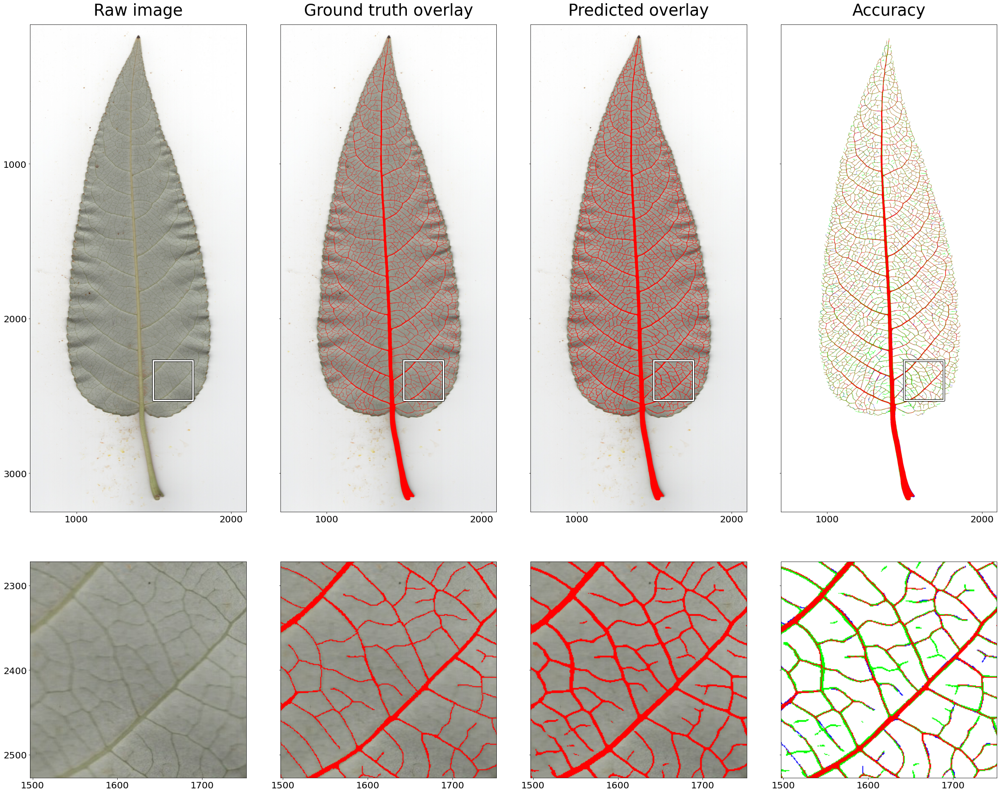

In [8]:
# options
image_path = '../data/images/'
leaf_mask_path = '../data/leaf_masks/'
leaf_pred_path = '../data/leaf_preds/'
vein_mask_path = '../data/vein_masks/'
vein_pred_path = '../data/vein_preds/'
save_path = '../figures/'
name = 'C_1_14_18_bot.png'
plot_width = 7
plot_height = 15
row, col = 2300, 675+3*64 # bbox centroid
width = 128 # bbox width
save = True
    
# load
image = np.array(Image.open(image_path + name.replace('.png', '.jpeg')), dtype=float)[:, :, :3] / 255
mask = np.array(Image.open(vein_mask_path + name), dtype=float) > 128
mask = mask[:, :, 0] if len(mask.shape) > 2 else mask
pred = np.array(Image.open(vein_pred_path + name), dtype=float) > 128
pred = pred[:, :, 0] if len(pred.shape) > 2 else pred
leaf = np.array(Image.open(leaf_mask_path + name), dtype=float) > 128
leaf = leaf[:, :, 0] if len(leaf.shape) > 2 else leaf

# format images
rmin, rmax = 100, 3250
cmin, cmax = 701, 2099
image, mask, pred = image[rmin:rmax, cmin:cmax], mask[rmin:rmax, cmin:cmax], pred[rmin:rmax, cmin:cmax]
leaf = leaf[rmin:rmax, cmin:cmax]

plot_width = figsize
plot_height = (rmax-rmin)/(cmax-cmin)*figsize

# build bbox
row, col, width = 2400, 1625, 128
bbox_rows = np.array([-width, width, width, -width, -width]) + row
bbox_cols = np.array([-width, -width, width, width, -width]) + col
    
# compute set similarities
true_positive = mask * pred
false_positive = pred * ~mask
false_negative = ~pred * mask
true_negative = ~mask * ~pred

# tpr
tpr = 1 + 0*np.concatenate([image, 0.5*np.ones_like(image[:, :, 0:1])], axis=-1)
tpr[true_positive]  = [1, 0, 0, 1]
tpr[false_positive] = [0, 1, 0, 1]
tpr[false_negative] = [0, 0, 1, 1]

# build overlays
mask_overlay = image.copy()
mask_overlay[mask] = [1, 0, 0]
pred_overlay = image.copy()
pred_overlay[pred] = [1, 0, 0]

# format tiles
image_tile = image[row-width-rmin:row+width-rmin, col-width-cmin:col+width-cmin]
tpr_tile = tpr[row-width-rmin:row+width-rmin, col-width-cmin:col+width-cmin]
mask_overlay_tile = mask_overlay[row-width-rmin:row+width-rmin, col-width-cmin:col+width-cmin]
pred_overlay_tile = pred_overlay[row-width-rmin:row+width-rmin, col-width-cmin:col+width-cmin]

# initialize plot
fig = plt.figure(figsize=[4*plot_width, plot_height+plot_width], constrained_layout=True)
gs = fig.add_gridspec(3, 4, wspace=0.1, hspace=0.0)

# image
ax = fig.add_subplot(gs[0:2, 0:1])
plt.imshow(image, vmin=0, vmax=1, extent=[cmin, cmax, rmax, rmin])
plt.plot(bbox_cols, bbox_rows, '-', color='black', linewidth=5)
plt.plot(bbox_cols, bbox_rows, '-', color='white', linewidth=3)
plt.yticks([i*n_tick for i in range(8)], [i*n_tick for i in range(8)], fontsize=tick_size)
plt.xticks([i*n_tick for i in range(8)], [i*n_tick for i in range(8)], fontsize=tick_size)
plt.xlim([cmin, cmax-1])
plt.ylim([rmax, rmin])
ax.set_title('Raw image', fontsize=title_size, pad=title_pad)

# image tile
ax = fig.add_subplot(gs[2:3, 0:1])
plt.imshow(image_tile, vmin=0, vmax=1, extent=[col-width, col+width, row+width, row-width])
plt.yticks([i*100 for i in range(100)], [i*100 for i in range(100)], fontsize=tick_size)
plt.xticks([i*100 for i in range(100)], [i*100 for i in range(100)], fontsize=tick_size)
plt.xlim([col-width, col+width-1])
plt.ylim([row+width-1, row-width])

# true mask overlay
ax = fig.add_subplot(gs[0:2, 1:2])
plt.imshow(mask_overlay, vmin=0, vmax=1, extent=[cmin, cmax, rmax, rmin])
plt.plot(bbox_cols, bbox_rows, '-', color='black', linewidth=5)
plt.plot(bbox_cols, bbox_rows, '-', color='white', linewidth=3)
plt.yticks([i*n_tick for i in range(8)], ['' for i in range(8)])
plt.xticks([i*n_tick for i in range(8)], [i*n_tick for i in range(8)], fontsize=tick_size)
plt.xlim([cmin, cmax-1])
plt.ylim([rmax, rmin])
ax.set_title('Ground truth overlay', fontsize=title_size, pad=title_pad)

# true mask overlay tile
ax = fig.add_subplot(gs[2:3, 1:2])
plt.imshow(mask_overlay_tile, vmin=0, vmax=1, extent=[col-width, col+width, row+width, row-width])
plt.yticks([i*100 for i in range(100)], ['' for i in range(100)], fontsize=tick_size)
plt.xticks([i*100 for i in range(100)], [i*100 for i in range(100)], fontsize=tick_size)
plt.xlim([col-width, col+width-1])
plt.ylim([row+width-1, row-width])

# true mask overlay
ax = fig.add_subplot(gs[0:2, 2:3])
plt.imshow(pred_overlay, vmin=0, vmax=1, extent=[cmin, cmax, rmax, rmin])
plt.plot(bbox_cols, bbox_rows, '-', color='black', linewidth=5)
plt.plot(bbox_cols, bbox_rows, '-', color='white', linewidth=3)
plt.yticks([i*n_tick for i in range(8)], ['' for i in range(8)])
plt.xticks([i*n_tick for i in range(8)], [i*n_tick for i in range(8)], fontsize=tick_size)
plt.xlim([cmin, cmax-1])
plt.ylim([rmax, rmin])
ax.set_title('Predicted overlay', fontsize=title_size, pad=title_pad)

# true mask overlay tile
ax = fig.add_subplot(gs[2:3, 2:3])
plt.imshow(pred_overlay_tile, vmin=0, vmax=1, extent=[col-width, col+width, row+width, row-width])
plt.yticks([i*100 for i in range(100)], ['' for i in range(100)], fontsize=tick_size)
plt.xticks([i*100 for i in range(100)], [i*100 for i in range(100)], fontsize=tick_size)
plt.xlim([col-width, col+width-1])
plt.ylim([row+width-1, row-width])

# tpr
ax = fig.add_subplot(gs[0:2, 3:4])
plt.imshow(tpr, vmin=0, vmax=1, extent=[cmin, cmax, rmax, rmin])
plt.plot(bbox_cols, bbox_rows, '-', color='black', linewidth=5)
plt.plot(bbox_cols, bbox_rows, '-', color='white', linewidth=3)
plt.yticks([i*n_tick for i in range(8)], ['' for i in range(8)])
plt.xticks([i*n_tick for i in range(8)], [i*n_tick for i in range(8)], fontsize=tick_size)
plt.xlim([cmin, cmax-1])
plt.ylim([rmax, rmin])
ax.set_title('Accuracy', fontsize=title_size, pad=title_pad)

# tpr tile
ax = fig.add_subplot(gs[2:3, 3:4])
plt.imshow(tpr_tile, vmin=0, vmax=1, extent=[col-width, col+width, row+width, row-width])
plt.yticks([i*100 for i in range(100)], ['' for i in range(100)], fontsize=tick_size)
plt.xticks([i*100 for i in range(100)], [i*100 for i in range(100)], fontsize=tick_size)
plt.xlim([col-width, col+width-1])
plt.ylim([row+width-1, row-width])

if save:
    plt.savefig(save_path + 'figure_s2.png', bbox_inches='tight', dpi=100)

plt.show()